Example of cell type harmonization, channel harmonization, and qc masking as preprocessing steps for a downstream neighborhood spatial analysis

In [1]:
import os
import re
from pathlib import Path
from collections import Counter

import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import tifffile

from mgitools.os_helpers import listfiles

In [2]:
root = '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca'
fps = sorted(listfiles(root, regex=r'level_4/cell_annotation_macro.h5ad$'))
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT206B1-H1/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT206B1_H1_06252022/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A1/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A4/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H3/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT339B1-H1A1/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT339B1-H2A1/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT339B1-H4A4/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT397B1-H2A2

In [3]:
samples = [
    'HT206B1-H1',
    'HT206B1_H1_06252022',
    'HT323B1-H1A1',
    'HT323B1-H1A4',
    'HT323B1-H3',
    'HT397B1-H2A2',
    'HT397B1-H3A1'
]
fps = [fp for fp in fps
       if fp.split('/')[-3] in samples]
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT206B1-H1/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT206B1_H1_06252022/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A1/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A4/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H3/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT397B1-H2A2/level_4/cell_annotation_macro.h5ad',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT397B1-H3A1/level_4/cell_annotation_macro.h5ad']

In [4]:
adatas = []
for fp in fps:
    print(fp)
    a = sc.read_h5ad(fp)
    
    s_id = fp.split('/')[-3]
    a.obs['sample_id'] = s_id
    a.obs['patient_id'] = re.sub(r'^(HT[^-_]+).*$', r'\1', s_id)
    a.obs['piece_id'] = re.sub(r'^HT[^-_]+.(.*)$', r'\1', s_id)
    
    adatas.append(a)
len(adatas)

/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT206B1-H1/level_4/cell_annotation_macro.h5ad
/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT206B1_H1_06252022/level_4/cell_annotation_macro.h5ad
/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A1/level_4/cell_annotation_macro.h5ad
/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A4/level_4/cell_annotation_macro.h5ad
/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H3/level_4/cell_annotation_macro.h5ad
/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT397B1-H2A2/level_4/cell_annotation_macro.h5ad
/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT397B1-H3A1/level_4/cell_annotation_macro.h5ad


7

#### fix channel names

In [5]:
channels = [c
            for a in adatas
            for c in a.raw.var.index.to_list()]
Counter(channels).most_common()

[('DAPI', 7),
 ('CD31', 7),
 ('E-cadherin', 7),
 ('CD4', 7),
 ('CD20', 7),
 ('Ki67', 7),
 ('CD68', 7),
 ('Pan-CK', 7),
 ('CD8', 7),
 ('Histone H3 Pho', 7),
 ('CD163', 7),
 ('Podoplanin', 7),
 ('CD36', 7),
 ('GLUT1', 7),
 ('GATA3', 7),
 ('SMA', 7),
 ('MGP', 7),
 ('Vimentin', 7),
 ('Foxp3', 7),
 ('HLA-DR', 7),
 ('CK14', 7),
 ('CD11c', 7),
 ('HIF1a', 6),
 ('CD45RO', 6),
 ('CD45RA', 6),
 ('CK19', 6),
 ('Maspin', 6),
 ('MMP9', 6),
 ('CD44', 6),
 ('CD3e', 6),
 ('CK17', 6),
 ('beta-integrin', 3),
 ('beta3-integrin', 2),
 ('cKit', 2),
 ('COX2', 2),
 ('MLPH', 2),
 ('Lyve-1', 2),
 ('CD3', 1),
 ('ER', 1),
 ('PR', 1),
 ('cKIT', 1),
 ('FGFR3', 1)]

In [6]:
m = {
    'CD3e': ['CD3'],
    'beta-integrin': ['beta3-integrin'],
    'cKit': ['cKIT']
}
m = {k:v for k, vs in m.items() for v in vs}

for a in adatas:
    a.raw.var.index = [m.get(c, c) for c in a.raw.var.index.to_list()]
    a.var.index = [m.get(c, c) for c in a.var.index.to_list()]
    
channels = [c
            for a in adatas
            for c in a.raw.var.index.to_list()]
Counter(channels).most_common()

[('DAPI', 7),
 ('CD31', 7),
 ('E-cadherin', 7),
 ('CD4', 7),
 ('CD20', 7),
 ('Ki67', 7),
 ('CD68', 7),
 ('Pan-CK', 7),
 ('CD8', 7),
 ('Histone H3 Pho', 7),
 ('CD163', 7),
 ('Podoplanin', 7),
 ('CD3', 7),
 ('CD36', 7),
 ('GLUT1', 7),
 ('GATA3', 7),
 ('SMA', 7),
 ('MGP', 7),
 ('Vimentin', 7),
 ('Foxp3', 7),
 ('HLA-DR', 7),
 ('CK14', 7),
 ('CD11c', 7),
 ('HIF1a', 6),
 ('CD45RO', 6),
 ('CD45RA', 6),
 ('CK19', 6),
 ('Maspin', 6),
 ('MMP9', 6),
 ('CD44', 6),
 ('CK17', 6),
 ('beta3-integrin', 5),
 ('cKIT', 3),
 ('COX2', 2),
 ('MLPH', 2),
 ('Lyve-1', 2),
 ('ER', 1),
 ('PR', 1),
 ('FGFR3', 1)]

#### harmonize cell types

In [7]:
for a in adatas:
    print(a.obs['sample_id'][0])
    print(Counter(a.obs['cell_type']).most_common())

HT206B1-H1
[('Tumor', 66680), ('Fibroblast', 21756), ('CD8 T cell', 11757), ('CD4 T cell', 8869), ('Noise', 8492), ('Macrophage - M1', 7339), ('Endothelial', 6371), ('Myoepithelial', 4241), ('Macrophage - M2', 3560), ('B cell', 1617), ('Treg', 1341), ('DC', 1315)]
HT206B1_H1_06252022
[('Tumor', 50099), ('Fibroblast', 23787), ('CD8 T cell', 13491), ('Noise', 11225), ('Endothelial', 9753), ('CD4 T cell', 9521), ('Macrophage - M1', 6899), ('Macrophage - M2', 4941), ('Myoepithelial', 4729), ('DC', 1427), ('B cell', 534)]
HT323B1-H1A1
[('Fibroblast', 21314), ('Tumor', 17490), ('Noise', 11381), ('Myoepithelial', 10056), ('CD8 T cell', 4948), ('Endothelial', 4145), ('Macrophage - M1', 4078), ('Macrophage - M2', 1899), ('CD4 T cell', 1860), ('DC', 1133), ('Treg', 495), ('B cell', 325)]
HT323B1-H1A4
[('Fibroblast', 32065), ('Tumor', 32022), ('Myoepithelial', 16713), ('CD8 T cell', 5572), ('Endothelial', 5255), ('Macrophage - M1', 3862), ('Macrophage - M2', 3530), ('CD4 T cell', 3354), ('Noise',

In a manual analysis of the channels for these samples, it was determined that foxp3, cd20, and cd11c stain is potential bad for these samples.

As such, B cell, DC, and Treg are low confidence calls and will be reverted based on the following:
    
Tregs -> CD4 T cell

DC -> Noise if < fibroblast threshold else fibroblast

B cell -> Noise if < fibroblast threshold else fibroblast

In [8]:
def get_gating_thresholds(adata, cell_type, channels, col_name='cell_type'):
    f = adata[adata.obs[col_name]==cell_type, channels]
    d = {c: np.max(f[:, c].X) for c in channels}
    return d

def recall_DC(adata, col_name='harmonized_cell_type'):
    thresholds = get_gating_thresholds(adata, 'Noise', ['SMA', 'Vimentin'], col_name=col_name)
    new = []
    for i, ct in zip(a.obs.index, a.obs[col_name]):
        if ct == 'DC':
            meets_thresh = any([adata[i, k].X[0, 0] > v for k, v in thresholds.items()])
            if meets_thresh:
                new.append('Fibroblast')
            else:
                new.append('Noise')
        else:
            new.append(ct)
    adata.obs[col_name] = new
    
    return adata

def recall_B_cell(adata, col_name='harmonized_cell_type'):
    thresholds = get_gating_thresholds(adata, 'Noise', ['SMA', 'Vimentin'], col_name=col_name)
    new = []
    for i, ct in zip(a.obs.index, a.obs[col_name]):
        if ct == 'B cell':
            meets_thresh = any([adata[i, k].X[0, 0] > v for k, v in thresholds.items()])
            if meets_thresh:
                new.append('Fibroblast')
            else:
                new.append('Noise')
        else:
            new.append(ct)
    adata.obs[col_name] = new
    
    return adata

In [9]:
for a in adatas:
    cell_types = sorted(set(a.obs['cell_type']))
    a.obs['harmonized_cell_type'] = a.obs['cell_type'].to_list()
    if 'Treg' in cell_types:
        a.obs['harmonized_cell_type'] = [c if c != 'Treg' else 'CD4 T cell'
                                         for c in a.obs['harmonized_cell_type']]
    a = recall_DC(a)
    a = recall_B_cell(a)

#### apply QC masks

In [10]:
# make sure our colors will match
color_map = ['#1f77b4', '#ff7f0e',  '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22']
for a in adatas:
    a.uns['harmonized_cell_type_colors'] = color_map

In [11]:
def visualize_roi(adata, scale=1000, size=10):
    fig, ax = plt.subplots(
    figsize=(int(max(adata.obs['centroid_col']) / scale), int(max(adata.obs['centroid_row']) / scale)))
    sc.pl.scatter(adata, x='centroid_col', y='centroid_row_inverted',
                  color='harmonized_cell_type', size=size, ax=ax)

HT206B1-H1


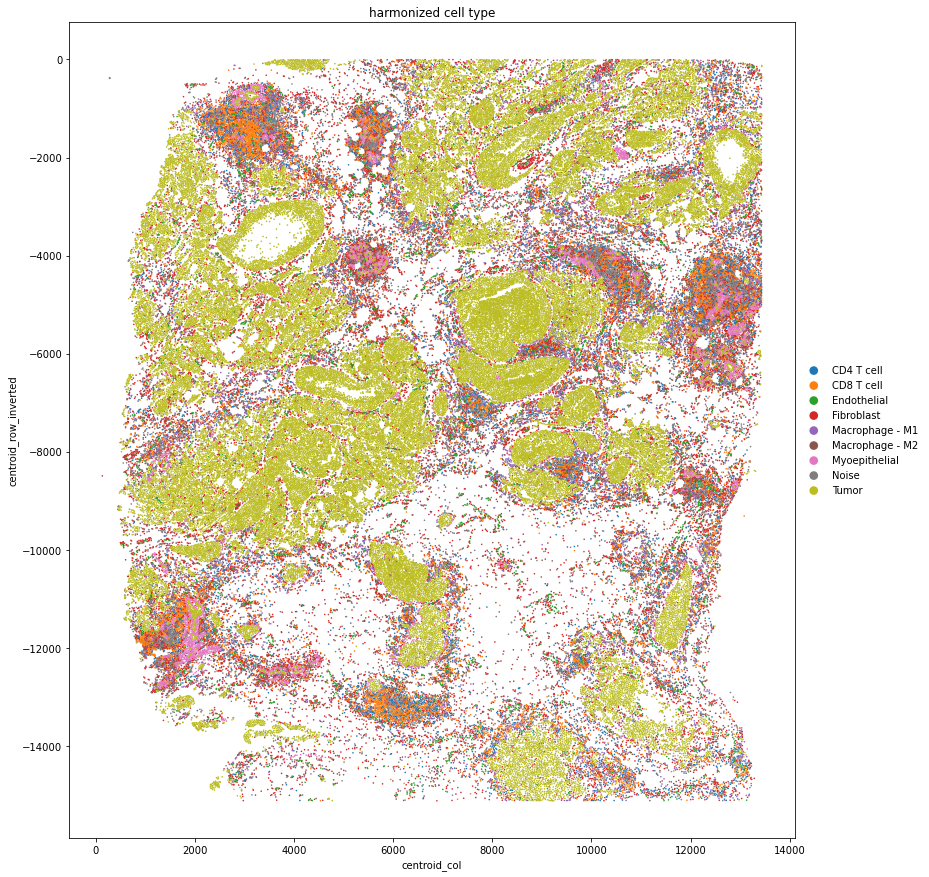

HT206B1_H1_06252022


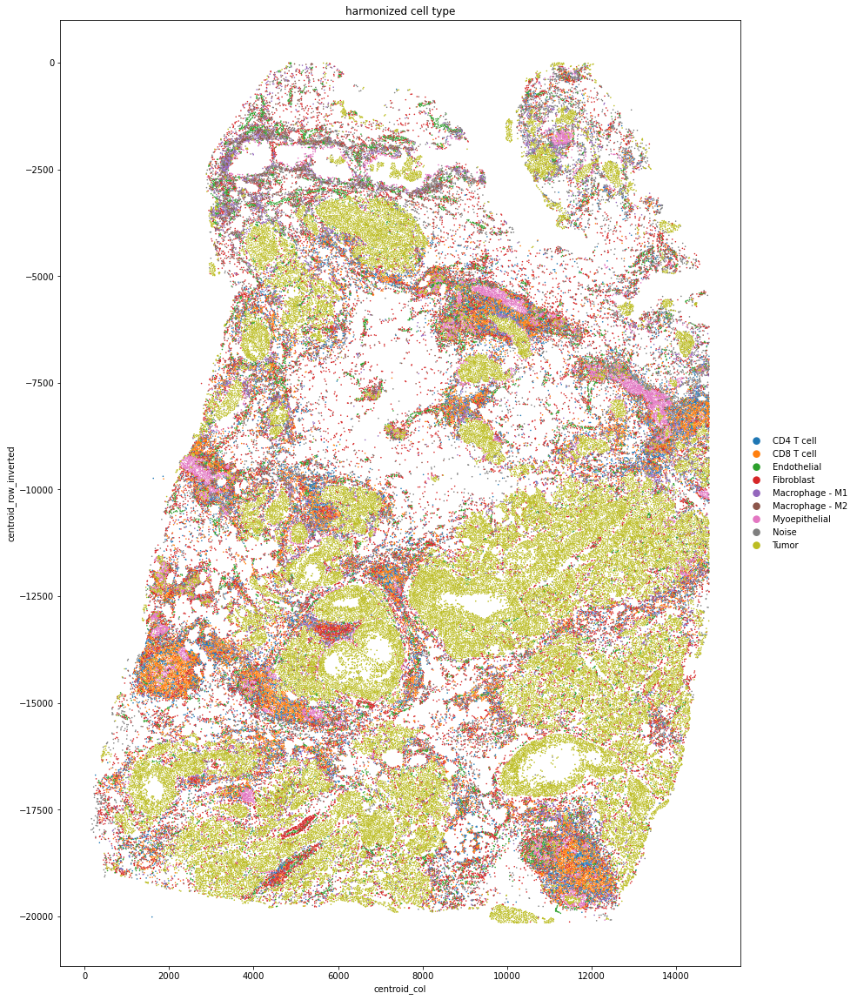

HT323B1-H1A1


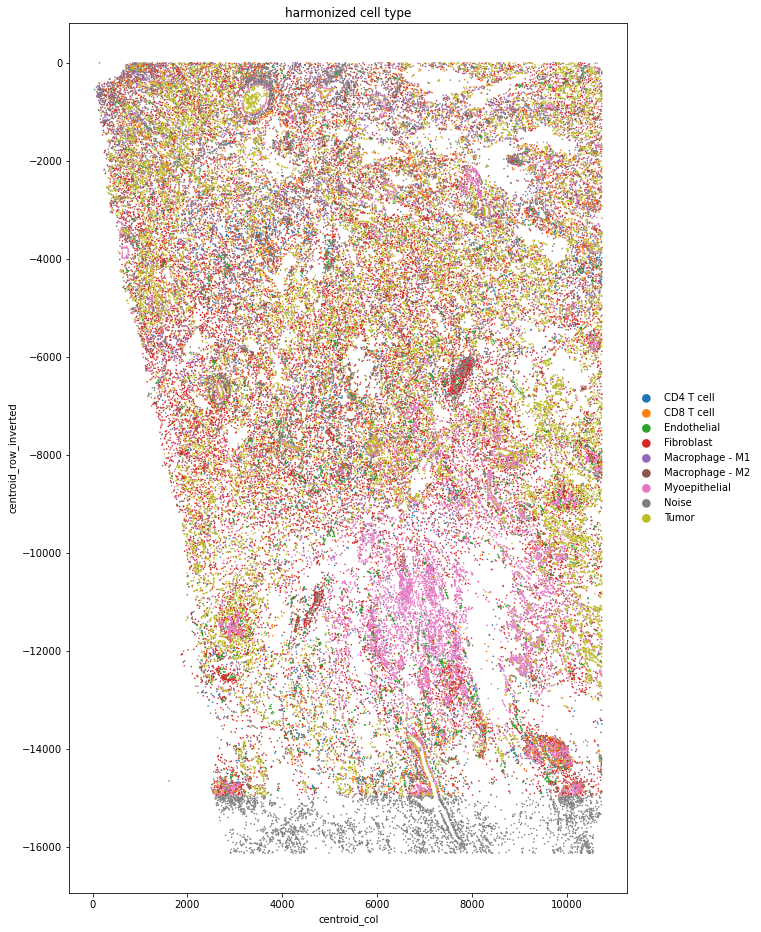

HT323B1-H1A4


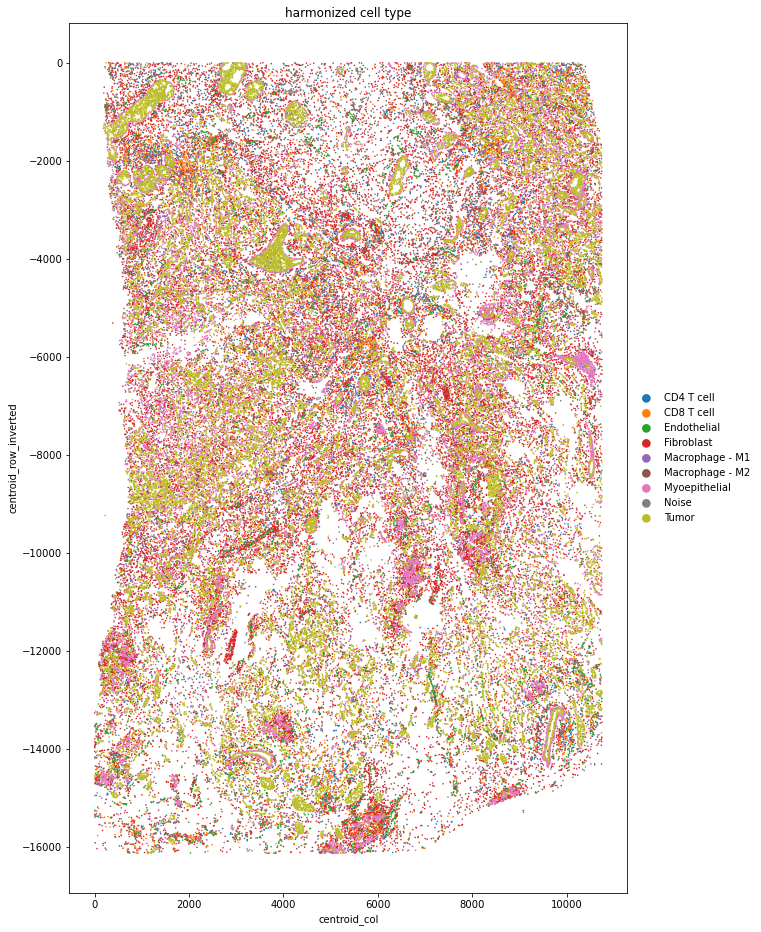

HT323B1-H3


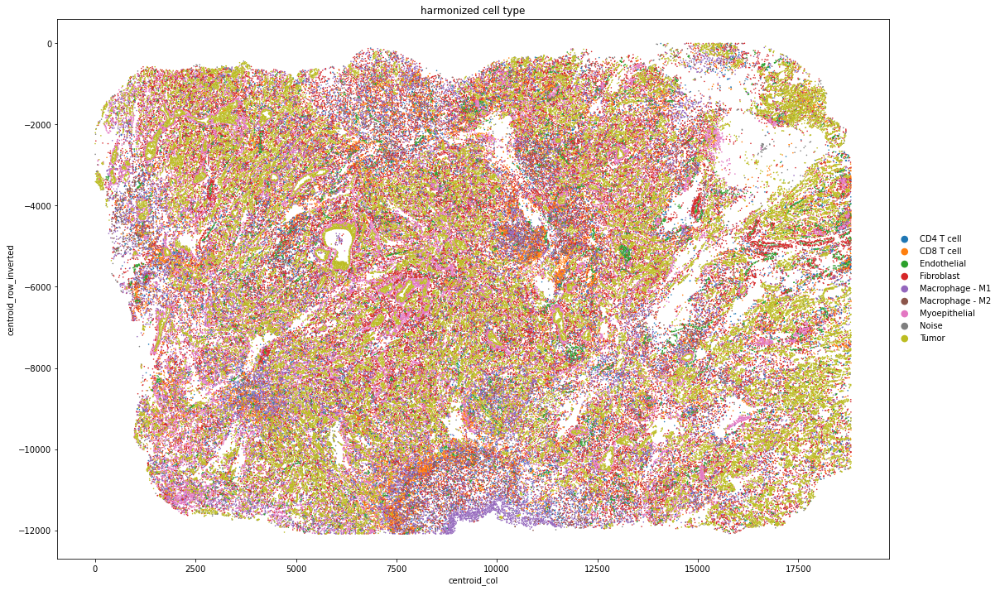

HT397B1-H2A2


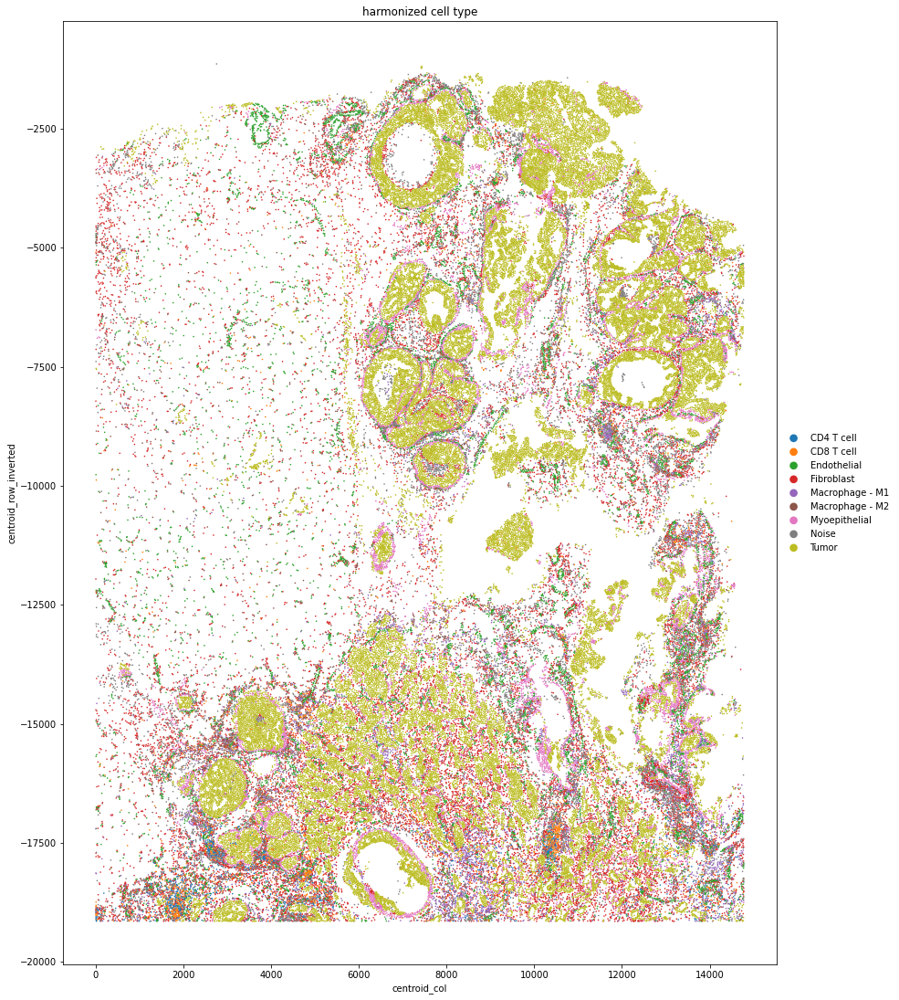

HT397B1-H3A1


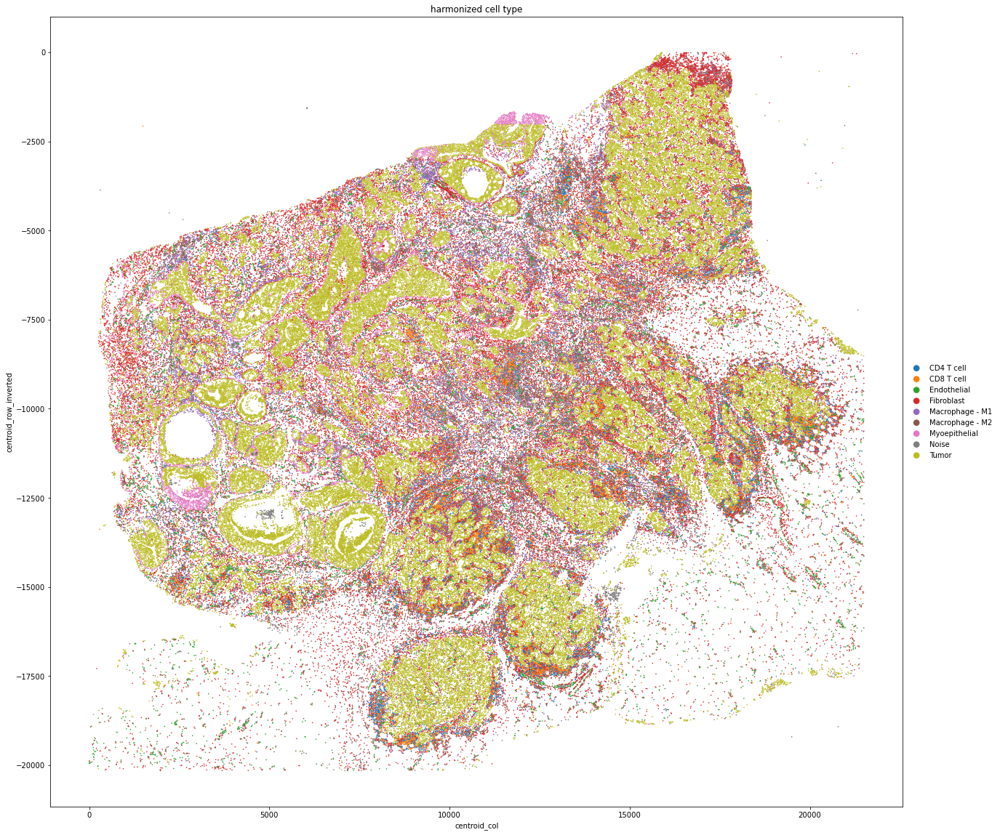

In [12]:
for a in adatas:
    print(a.obs['sample_id'][0])
    visualize_roi(a)

the below masks were created in qitissue after looking for problem regions that may confound the analysis

In [13]:
fps = sorted(listfiles(root, regex=r'dcis_neighborhood_analysis/qc_mask.tif$'))
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A1/downstream_analyses/dcis_neighborhood_analysis/qc_mask.tif',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT397B1-H3A1/downstream_analyses/dcis_neighborhood_analysis/qc_mask.tif']

In [14]:
sample_to_adata = {a.obs['sample_id'][0]:a for a in adatas}

HT323B1-H1A1


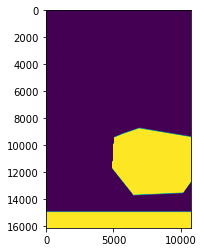

HT397B1-H3A1


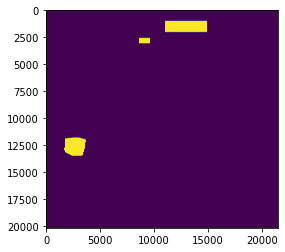

In [15]:
for fp in fps:
    img = tifffile.imread(fp)
    img[img>0] = 1
    img = img.astype(bool)
    
    s_id = fp.split('/')[-4]
    print(s_id)
    sample_to_adata[s_id].uns['qc_mask'] = img
    
    plt.imshow(img)
    plt.show()

In [18]:
for a in adatas:
    if 'qc_mask' in a.uns:
        a.obs['passes_qc'] = [~a.uns['qc_mask'][int(r), int(c)]
                              for r, c in zip(a.obs['centroid_row'], a.obs['centroid_col'])]
    else:
        a.obs['passes_qc'] = True
    

#### save objects

In [23]:
for a in adatas:
    s_id = a.obs['sample_id'][0]
    directory = os.path.join(root, s_id, 'downstream_analyses', 'dcis_neighborhood_analysis')
    Path(directory).mkdir(parents=True, exist_ok=True)
    a.write_h5ad(os.path.join(directory, 'preprocessed_adata.h5ad'))